# Import Python packages

In [1]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn import metrics
from sklearn.metrics import roc_auc_score
from sklearn import metrics
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.multioutput import MultiOutputRegressor

from sklearn.preprocessing import OneHotEncoder,OrdinalEncoder
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler

import torch
from torch.utils.data import TensorDataset, DataLoader
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torch import nn
from torch.nn import  functional as F

In [2]:
from sklearn.neural_network import MLPRegressor

# Make dataset

In [3]:
pd_train = pd.read_excel("D:/database/data_all_strain-controlled.xls",nrows=100000)#Change this path to your own path 
pd_train.head()

,load,E(Gpa),TS(Mpa),ss（Mpa）,m,Unnamed: 5,Nf(label)
0,q235b-0.002.csv,206.0,412.0,235.0,0.304,NaN,4.427583
1,q235b-0.003.csv,206.0,412.0,235.0,0.304,NaN,4.071256
2,q235b-0.004.csv,206.0,412.0,235.0,0.304,NaN,3.812111
3,q235b-0.005.csv,206.0,412.0,235.0,0.304,NaN,3.573104
4,q235b-0.006.csv,206.0,412.0,235.0,0.304,NaN,3.409764


In [4]:
pd_train.drop(columns=['Unnamed: 5'],inplace=True)
pd_train

,load,E(Gpa),TS(Mpa),ss（Mpa）,m,Nf(label)
0,q235b-0.002.csv,206.0,412.0,235.0,0.304000,4.427583
1,q235b-0.003.csv,206.0,412.0,235.0,0.304000,4.071256
2,q235b-0.004.csv,206.0,412.0,235.0,0.304000,3.812111
3,q235b-0.005.csv,206.0,412.0,235.0,0.304000,3.573104
4,q235b-0.006.csv,206.0,412.0,235.0,0.304000,3.409764
...,...,...,...,...,...,...
909,AZ31B-4-0.004-0.0069.csv,44.8,298.0,244.0,0.325444,3.281033
910,AZ31B-4-0.005-0.0087.csv,44.8,298.0,244.0,0.325444,2.763428
911,AZ31B-4-0.0075-0.013.csv,44.8,298.0,244.0,0.325444,2.255273
912,AZ31B-4-0.0100-0.0173.csv,44.8,298.0,244.0,0.325444,1.832509


In [5]:
pd_train.shape

(914, 6)

In [6]:
pd_train['Nf(label)'].value_counts()

Nf(label)
2.838849    4
3.429914    3
2.763428    3
3.152288    3
2.602060    3
           ..
2.819544    1
2.444045    1
2.822168    1
2.735599    1
1.544068    1
Name: count, Length: 872, dtype: int64

In [7]:
pd_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 914 entries, 0 to 913
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   load       914 non-null    object 
 1   E(Gpa)     914 non-null    float64
 2   TS(Mpa)    914 non-null    float64
 3   ss（Mpa）    914 non-null    float64
 4   m          914 non-null    float64
 5   Nf(label)  914 non-null    float64
dtypes: float64(5), object(1)
memory usage: 43.0+ KB


# Read csv files

In [8]:
csv_path = 'D:/database/All data_Strain/'#Change this path to your own path

In [9]:
csv_files = pd_train['load'].values
csv_files[:5]

array(['q235b-0.002.csv', 'q235b-0.003.csv', 'q235b-0.004.csv',
       'q235b-0.005.csv', 'q235b-0.006.csv'], dtype=object)

In [10]:
one_df = pd.read_csv(csv_path+csv_files[10],header=None)
one_df.head()


,0,1
0,0.0,0.000000
1,0.0,0.000144
2,0.0,0.000289
3,0.0,0.000433
4,0.0,0.000577


In [11]:
pd.read_csv(csv_path+'E355-20-14-0.0036-0.0061.csv',header=None).iloc[:,:2]

,0,1
0,0.000000,0.000000
1,0.000932,0.001112
2,0.001800,0.002186
3,0.002546,0.003187
4,0.003118,0.004082
...,...,...
236,-0.003118,-0.004082
237,-0.002546,-0.003187
238,-0.001800,-0.002186
239,-0.000932,-0.001112


In [12]:
value_list = []
for i in range(len(csv_files)):
    try:
      # print(csv_files[i])
      one_df = pd.read_csv(csv_path+csv_files[i],header=None).iloc[:,:2]
      value_list.append(one_df.values)
      print(one_df.shape)
    except:
      print(csv_path+csv_files[i] , 'no here ')

(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(

# Merge into a large array

In [13]:
csv_value_array = np.array(value_list)
csv_value_array.shape

(914, 241, 2)

In [14]:
flatten_value_list = [item.flatten() for item in  value_list]
flatten_value_list[0].shape

(482,)

<Axes: >

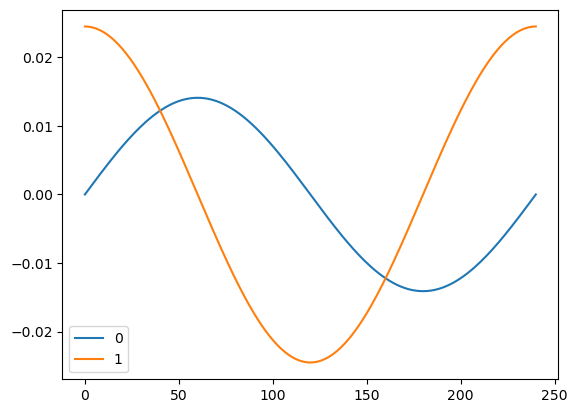

In [15]:
one_df.plot()

# Data processing pipline

In [16]:
pd_train.head()

,load,E(Gpa),TS(Mpa),ss（Mpa）,m,Nf(label)
0,q235b-0.002.csv,206.0,412.0,235.0,0.304,4.427583
1,q235b-0.003.csv,206.0,412.0,235.0,0.304,4.071256
2,q235b-0.004.csv,206.0,412.0,235.0,0.304,3.812111
3,q235b-0.005.csv,206.0,412.0,235.0,0.304,3.573104
4,q235b-0.006.csv,206.0,412.0,235.0,0.304,3.409764


In [17]:
# Filter out columns of non object type
num_cols = pd_train.select_dtypes(exclude=['object']).columns.tolist()[:-1]

print("Non-object columns:", num_cols)

Non-object columns: ['E(Gpa)', 'TS(Mpa)', 'ss（Mpa）', 'm']


In [18]:
num_si_step = ('si', SimpleImputer(strategy='median'))
num_ss_step = ('ss', StandardScaler()) #Normalization of mean standard deviation
num_steps = [num_si_step, num_ss_step]

num_pipe = Pipeline(num_steps)
num_transformers = [('num', num_pipe, num_cols)]

ct = ColumnTransformer(transformers=num_transformers)

x_all = ct.fit_transform(pd_train)
x_all.shape

(914, 4)

In [19]:
x_all[:5]

array([[ 0.8308825 , -0.48597853, -0.53890809, -0.10796619],
       [ 0.8308825 , -0.48597853, -0.53890809, -0.10796619],
       [ 0.8308825 , -0.48597853, -0.53890809, -0.10796619],
       [ 0.8308825 , -0.48597853, -0.53890809, -0.10796619],
       [ 0.8308825 , -0.48597853, -0.53890809, -0.10796619]])

In [20]:
y_all = pd_train['Nf(label)'].values
y_all.shape,y_all[:10]

((914,),
 array([4.42758347, 4.07125588, 3.81211084, 3.57310378, 3.4097641 ,
        3.0374265 , 4.61187194, 4.30209272, 3.98421217, 3.88109922]))

In [21]:
dim_num = x_all.shape[-1]
dim_num

4

# Divide the dataset and test set

In [22]:
from sklearn.model_selection import train_test_split

# x_all_new, csv_value_array, y_all are 3 NumPy arrays
x_train, x_test, csv_value_train, csv_value_test, y_train, y_test,csv_files_train, csv_files_test = train_test_split(x_all, csv_value_array, y_all,csv_files, test_size=0.2, random_state=42)

print("The size of the training set：", x_train.shape[0])
print("The size of the test set：", x_test.shape[0])
x_train.shape, x_test.shape, csv_value_train.shape, csv_value_test.shape, y_train.shape, y_test.shape

训练集的大小： 731
测试集的大小： 183


((731, 4), (183, 4), (731, 241, 2), (183, 241, 2), (731,), (183,))

# Pytorch dataset dataloader
   
  Prepare Dataset

In [23]:
x_train, x_test, csv_value_train, csv_value_test, y_train, y_test

(array([[-1.40434922, -0.91169623, -0.35126438, -0.20713854],
        [ 0.8308825 , -0.48597853, -0.53890809, -0.10796619],
        [ 0.67425312, -0.63873605, -0.48032664, -0.20713854],
        ...,
        [-1.82365911, -1.04108102, -0.73570516,  0.29174678],
        [ 0.87982918,  3.82676089,  3.69451712, -0.20713854],
        [ 0.67425312, -0.63873605, -0.48032664, -0.20713854]]),
 array([[ 0.8716714 ,  0.47814685,  0.67391102, -0.20713854],
        [-1.82365911, -1.04108102, -0.73570516,  0.29174678],
        [ 0.93693364,  0.06703711, -0.12975327,  0.04079234],
        [ 0.93693364,  0.06703711, -0.12975327,  0.04079234],
        [ 0.93693364,  0.06703711, -0.12975327,  0.04079234],
        [ 0.6677269 ,  2.3980502 ,  2.73799185, -0.87655194],
        [-1.42066478, -0.78648514, -0.8409687 ,  0.53665412],
        [-0.37646894, -0.67796886, -0.98284566,  0.53665412],
        [-1.41577011, -1.24934879, -0.7379935 ,  1.0325159 ],
        [ 0.8308825 , -0.48597853, -0.53890809, -0.1079

In [24]:
from torch.utils.data import TensorDataset

train_ds = TensorDataset(torch.tensor(x_train).float(),torch.tensor(csv_value_train).float(), torch.tensor(y_train).float().unsqueeze(1))
test_ds = TensorDataset(torch.tensor(x_test).float(),torch.tensor(csv_value_test).float(), torch.tensor(y_test).float().unsqueeze(1))

In [25]:
len(train_ds), len(test_ds)

(731, 183)

# Prepare dataloader

In [70]:
batch_size = 31
train_dl = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
test_dl = DataLoader(test_ds, batch_size=batch_size, shuffle=False)

In [71]:
train_dl

# Check shape of the input data

In [72]:
for b_x, b_x_csv,b_y in test_dl:
  print(b_x.shape)
  print(b_x_csv.shape)
  print(b_y.shape)
  break

torch.Size([31, 4])
torch.Size([31, 241, 2])
torch.Size([31, 1])


In [73]:
b_y

tensor([[3.8176],
        [4.4358],
        [5.6955],
        [2.8451],
        [5.9240],
        [3.6521],
        [4.6064],
        [3.3818],
        [4.3040],
        [3.1956],
        [4.4381],
        [2.3711],
        [3.0817],
        [3.8833],
        [2.8331],
        [3.8063],
        [3.4143],
        [4.2310],
        [4.9761],
        [3.5997],
        [3.2810],
        [4.4846],
        [3.9415],
        [4.1056],
        [3.9089],
        [3.1024],
        [3.5700],
        [3.7679],
        [2.6021],
        [1.9731],
        [2.6294]])

# Prepare for training

In [74]:
def train(dataloader, model, loss_fn, optimizer):
    size = len(dataloader.dataset)
    model.train()
    for batch, (X,x_csv, y) in enumerate(dataloader):
        X, x_csv,y = X.to(device), x_csv.to(device), y.to(device)

        # Compute prediction error
        pred = model(X,x_csv)
        loss = loss_fn(pred, y)

        # Backpropagation
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if batch % 5 == 0:
            loss, current = loss.item(), (batch + 1) * len(X)
            print(f"loss: {loss:>7f}  [{current:>5d}/{size:>5d}]")

def test(dataloader, model, loss_fn):
    size = len(dataloader.dataset)
    num_batches = len(dataloader)
    model.eval()
    test_loss, correct = 0, 0
    with torch.no_grad():
        for (X,x_csv, y) in dataloader:
            X, x_csv,y = X.to(device), x_csv.to(device), y.to(device)

            pred = model(X,x_csv)
            test_loss += loss_fn(pred, y).item()
    test_loss /= num_batches
    print(f"Avg loss: {test_loss:>8f} \n")
    return test_loss

In [75]:
# Get cpu or gpu device for training.
device = "cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu"
print(f"Using {device} device")

Using cuda device


# Build model
  structural data part

In [76]:
class DNNModel(nn.Module):
    def __init__(self,):
        super().__init__()
        self.nor = nn.BatchNorm1d(dim_num)
        self.lin1 = nn.Linear(dim_num,200)
        self.lin2 = nn.Linear(200,100)
        self.lin3 = nn.Linear(100,100)
        #self.out = nn.Linear(10, 1)
        self.flatten = nn.Flatten()

    def forward(self, x):

        x= F.relu(self.lin1(x))
        x= F.relu(self.lin2(x))
        x= F.relu(self.lin3(x))
        # x = self.out(x)

        return x
dnn_block = DNNModel().to(device)

dnn_block(b_x.to(device)).shape

torch.Size([31, 100])

CNN part

In [77]:
class CNNModel(nn.Module):
    def __init__(self,):
        super().__init__()
        self.nor = nn.BatchNorm1d(dim_num)
        self.cnn1 = nn.Conv1d(241, 50, 1)
        self.flatten = nn.Flatten()
        self.lin1 = nn.Linear(100,100)
        # self.lin2 = nn.Linear(10,1)


    def forward(self, x):
        # x = self.flatten(x)
        x= F.relu(self.cnn1(x))
        x = self.flatten(x)
        x= self.lin1(x)

        return x
cnn_block = CNNModel().to(device)

cnn_block(b_x_csv.to(device)).shape

torch.Size([31, 100])

Merge models

In [78]:
class bigModel(nn.Module):
    def __init__(self, ):
        super().__init__()
        self.strct_block = dnn_block
        #self.lstm_block = lstm_block
        #self.f_block = f_block
        self.cnn_block = cnn_block

        self.flatten = nn.Flatten()
        self.att = nn.TransformerEncoderLayer(100,2)

        self.lin1 = nn.Linear(200, 100)
        self.lin2 = nn.Linear(100, 100)
        self.out = nn.Linear(100, 1)
    def forward(self, b_x, b_x_csv):
        x_strct = self.strct_block(b_x)
        #x_lstm = self.lstm_block(b_x_csv)
        #x_f = self.f_block(b_x_csv)
        x_cnn = self.cnn_block(b_x_csv)
        x = torch.stack((x_strct, x_cnn), dim=1)
        print(x.shape)
        #x = self.att(x)
        x = self.flatten(x)
        print(x.shape)
        x = F.relu(self.lin1(x))
        #x = torch.cat((x, x_f), dim=1)
        #print(x.shape)
        x = F.relu(self.lin2(x))
        x = self.out(x)
        return x

big_model = bigModel().to(device)
big_model(b_x.to(device), b_x_csv.to(device)).shape

torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 1])

Loss function and optimizer

In [79]:
loss_fn = nn.MSELoss()
optimizer = torch.optim.AdamW(big_model.parameters(), lr=1e-3)

Training and testing

In [80]:
# Initialize Best Test Loss
best_test_loss = float('inf')

epochs = 3000
train_loss_list = []
test_loss_list = []

for t in range(epochs):
    print(f"Epoch {t+1}\n-------------------------------")
    train(train_dl, big_model, loss_fn, optimizer)
    train_loss = test(train_dl, big_model, loss_fn)
    test_loss = test(test_dl, big_model, loss_fn)

    train_loss_list.append(train_loss)
    test_loss_list.append(test_loss)

    # Save Best Model Weights
    if test_loss < best_test_loss:
        best_test_loss = test_loss
        torch.save(big_model.state_dict(), 'best_model_weights_CNN.pth')
        print(f"Best model saved! loss is {best_test_loss}")

print("Done!")

# Load Best Model Weights
best_model = big_model
best_model.load_state_dict(torch.load('best_model_weights_CNN.pth'))
best_model.eval()  # Set the model to evaluation mode and disable the impact of Dropout and Batch Normalization


Epoch 1
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 12.586228  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 14.457199  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 11.815528  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 4.092294  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.726110  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.644713  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.218545  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.686456  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.522716  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.654601  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.233613  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.554021  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.476854  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.295291  [  651/  731]
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.469824  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.477163  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.440058  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.293913  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.503591  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.320546  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.240616  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.476738  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.191148  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.210738 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.188566 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

loss: 0.193330  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.207147  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.329485  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.220139  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.139145  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.173586  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.196042  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

loss: 0.082095  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.113563  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.177241  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.182057  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.099051  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.1

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.121663 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.190311 

Best model saved! loss is 0.19031084204713503
Epoch 48
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.055280  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.117498  [  186/  731]
torch.Size([

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.083812  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.079834  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.153034  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.128869  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.088520  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.142004  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.140844  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.098454  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.105425  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.083524  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.102981  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.075108  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.046150  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.127202  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.053070  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.093554  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.084221  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.086306  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.052545  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.091527  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.177283 

Epoch 75
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.054844  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.097097  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.104974  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.082237  [  496/  731]
torch.Size([31, 2, 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.0

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

loss: 0.089299  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.074389  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.072986  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.033092  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.032248  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.058226  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.083459  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.080815  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

Best model saved! loss is 0.1631804689144095
Epoch 109
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.102009  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.083379  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.049512  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.086452  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.065434  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.090508  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.074688  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.051759  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.067361  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.096427  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.061524 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.171769 

Epoch 123
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.056826  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31,

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.129357  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.104159  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.052256  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.081422  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.173364 

Epoch 130
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.043952  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.088330  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.050656  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
l

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.072413 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.0

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.038261  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

loss: 0.069950  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.050308  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.078676  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.078603  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.069407  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.052678  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.058261 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.185086 

Epoch 152
--------

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.042894  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.067151  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.053715  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.055594  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.053066  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.067480  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.065103  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.052055  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.101721  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.057983  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.043487  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.048891 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.176883 

Epoch 170
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.056809  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.037017  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.054565  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.044798  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.035353  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.033578  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.039236  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.079104  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.037012  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.039097  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.065619  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.046992  [  651/  731]
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.052113 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.047061 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([1

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.053929  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.068125  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.077442  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.040347  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.030989  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.061582  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.045262 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.200426 

Epoch 224
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.058141  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.061016  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.0

torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.074923  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

loss: 0.127156  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.036224  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.076112  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.047780  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.056945  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.021232  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.087132  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.055951  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.040065  [

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.040915 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

loss: 0.038947  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

loss: 0.038152  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.057591  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.019828  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.026286  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.041227  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.046278  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.054854  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.028967  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.074532  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.038863  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.040501  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.037684  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.062716  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.036030  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.025140  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.028137  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.022167  [

loss: 0.023324  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.022453  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.019813  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.027757  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.047261 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.266350 

Epoch 296
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.030020  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.026490  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.0

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.048551  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.067403  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.056903  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.021151  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.058446  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.065626  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.057967  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.036456  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.032024  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.030144  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.018041  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.051254  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.034936  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.019325  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.037444  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.026640  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.031665  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.021347  [  651/  731]
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.269759 

Epoch 320
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.028298  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.041353  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.027415  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
l

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.028699 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.266815 

Epoch 324
-------------------------------
torch.Size([31, 2, 100]

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.031263 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.025711 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.296988 

Epoch 331
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.024170  [   31/

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.030701  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.068359  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.033341  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.027694  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

loss: 0.036910  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.031708  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.030247  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.043402  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.023536  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.044115  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.029833  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.010040  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.021783  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011533  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.028530  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

loss: 0.025318  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.026038  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.027685  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.022156  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.024426 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.302607 

Epoch 362
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.028559  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.017346  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.032772 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.299521 

Epoch 366
--------

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.034471 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.350098 

Epoch 369
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.020493  [   31/

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.016966  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.027951  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.040638  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

loss: 0.016889  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.028926  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.011572  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.057265  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.023588  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.026324  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.024316  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.067216  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.029400  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.016731  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.075892  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.020450  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

loss: 0.016386  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.031957  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.042297  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.034522  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.026990 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.330097 

Epoch 410
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.031614  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.017136  [  186/  731]
torch.Size

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.020769 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.330746 

Epoch 413
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014185  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009761  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.023375 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.354567 

Epoch 416
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013393  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31,

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010468  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013021  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010144  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.020004 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.327293 

Epoch 427
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.030994  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.016735  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([1

loss: 0.020345  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.017077  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.022536  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.024079  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009781  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010534  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009867  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.029306  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.025542  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.027133  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009232  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014633  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.017977  [

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.311653 

Epoch 453
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.020266  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.018355  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015280  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
t

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.017293 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.316304 

Epoch 457
--------

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.018424  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.026567  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.024763  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007120  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010453  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013094  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.023052  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.029373  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.016531  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.021035  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010131  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.017884  [  651/  731]
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.306581 

Epoch 486
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.020518  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014005  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011047  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
t

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.019238 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.323874 

Epoch 490
-------------------------------
torch.Size([31, 2, 100]

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.022135 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.326563 

Epoch 493
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.027059  [   31/

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.013294 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.024544  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.025435  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013551  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.020327  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.016082  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.050065  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008216  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.023568  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013634  [  651/  731]
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.040245  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.019307  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011458  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014376  [  651/  731]
torch.Size([31, 2, 100])
torch.Siz

Avg loss: 0.019626 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.330065 

Epoch 514
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011330  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009197  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.024341  [  341/  731]
torch.Size([31, 2, 100])
to

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.015548 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.321282 

Epoch 518
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015082  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31,

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.016179 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.016448  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.021736  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014328  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.016287  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012977  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.017191  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.018288  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010197  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015143  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013937  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.305176 

Epoch 539
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013630  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015878  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.032443  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014378  [  496/  731]
torch.Size([31, 2,

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.015539 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.320857 

Epoch 543
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015945  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012458  [  186/  731]
torch.Size

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.014076 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.319558 

Epoch 546
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012843  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015044  [  186/  731]
torch.Size

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.0

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009127  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008816  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.017560  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.019119  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013667  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014716  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013074  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.022437  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008154  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.018169  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015057  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.018923  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.034231  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014395  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014210  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006748  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012614  [

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.012577 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.332861 

Epoch 570
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011369  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31,

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.011453 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.313382 

Epoch 574
--------

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.010760 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009868  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.016490  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.041037  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.016225  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006506  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007300  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011370  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009900  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.019469  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008582  [

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.330121 

Epoch 597
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.018913  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011440  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011702  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
t

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.011700 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.032397  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.026990  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015620  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008919  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011821  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015711  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.016505  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006944  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.015035 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.304665 

Epoch 616
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014362  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31,

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.010024 

torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.0

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.009967 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009330  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.022603  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010383  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010726  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008243  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011713  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007363  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006993  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005876  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009351  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009226  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012475  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010174  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010170  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007585  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006889  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008052  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009168  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010879  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010709  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006869  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.017834  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014288  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.011282 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.317290 

Epoch 657
-------------------------------
torch.Size([31, 2, 100]

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.012833 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.328462 

Epoch 660
-------------------------------
torch.Size([31, 2, 100]

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.013119 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.027016  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008019  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.008851 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009441  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007552  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004753  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007244  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008113  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011119  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

loss: 0.005957  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.016162  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005882  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013311  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.008948 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011793  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005515  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005115  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.011445  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015017  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008016  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

loss: 0.018473  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008096  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008517  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007310  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

loss: 0.007145  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010216  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.017558  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011128  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009128  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.016580  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010219  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014260  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

Avg loss: 0.315983 

Epoch 722
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013300  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005306  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007707  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010802  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2,

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.008270 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.305065 

Epoch 726
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006471  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31,

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.307796 

Epoch 729
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009666  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009123  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007187  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
t

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004124  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003822  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008742  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010118  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.009226 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.287065 

Epoch 744
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007561  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31,

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.011067 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.296325 

Epoch 748
--------

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010399  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005920  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011538  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005003  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007824  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013386  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007025  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010734  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004095  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.023657  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006984  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007775  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013551  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011972  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004260  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006534  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007606  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.021803  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010838  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.006847 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.286700 

Epoch 783
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004335  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010770  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.00

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([1

loss: 0.004189  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008968  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003402  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015253  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008547  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005560  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004703  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007059  [

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004729  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009699  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013041  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004847  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004235  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007954  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008897  [  651/  731]
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.007150 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.023812  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006822  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006222  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002808  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008878  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.019867  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.016554  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007584  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012330  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008777  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011847  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.007985 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

loss: 0.005862  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005731  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007401  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007573  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005061  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005266  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006327  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011252  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006306  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.258429 

Epoch 857
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010716  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006343  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005180  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
t

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008934  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006761  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015872  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008628  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012813  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.018972  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004780  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008202  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003906  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002888  [

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.009065 

torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008956  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007158  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008487  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004808  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013654  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002876  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007863  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009516  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.005456 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.253956 

Epoch 893
-------------------------------
torch.Size([31, 2, 100]

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006504  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007809  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011590  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005556  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014872  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

loss: 0.003358  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012043  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012635  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008076  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.005207 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.252302 

Epoch 912
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004439  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31,

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001467  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008428  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012011  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007197  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008124  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002673  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003691  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009677  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005855  [

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008847  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008512  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.027622  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011682  [

Avg loss: 0.229500 

Epoch 937
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007559  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003877  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011979  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005018  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2,

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.006637 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.230083 

Epoch 941
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006317  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007611  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.247906 

Epoch 944
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006043  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004843  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003713  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
l

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009790  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002910  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005522  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004913  [

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011428  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007682  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005467  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003436  [  651/  731]
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006041  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008333  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004965  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.018443  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004471  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006880  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010488  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009847  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006425  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.017483  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

loss: 0.006632  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003519  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004788  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002960  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008048  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014318  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013284  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004710  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007338  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011953  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.018352  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008500  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.234024 

Epoch 982
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008675  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006637  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.017494  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
t

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.239712 

Epoch 985
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009582  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004050  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005729  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
t

torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007817  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004989  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


Avg loss: 0.005869 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.244614 

Epoch 996
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007549  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010305  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003748  [  341/  731]
torch.Size([31, 2, 100])
to

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004079 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.006179 

torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006789  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008882  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007862  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005831  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004873  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

loss: 0.014765  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009488  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007322  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009629  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005281  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013051  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009485  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.226414 

Epoch 1021
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006802  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005011  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004886  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.005669 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.223217 

Epoch 1025
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003160  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.009718 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.236318 

Epoch 1028
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006768  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007963  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.016902 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.239794 

Epoch 1031
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008096  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.017744  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.0

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.0

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.007023 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.221233 

Epoch 1038
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008412  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006812  [  186/  731]
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.011801 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.225750 

Epoch 1041
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005397  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007931  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

loss: 0.005849  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004644  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008129  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004863  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.020564  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006326  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011221  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011286  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002811  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012951  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005940  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.023382  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.036006  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.016371  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002222  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009618  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005869  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003558  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.018076  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002230  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006504  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005170  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010506  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003465  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006738  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004425  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007185  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007899  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011287  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

loss: 0.004388  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012527  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005869  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004133  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005899  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002650  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.007741 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.244305 

Epoch 1094
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004265  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004741  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.007395 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011497  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006774  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012983  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009632  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014181  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.222734 

Epoch 1109
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007996  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002923  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010241  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.006888 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.226623 

Epoch 1113
-------

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003316  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.019200  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010591  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005752  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.009373 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.221855 

Epoch 1133
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009263  [   31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.013104 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.226331 

Epoch 1136
-------------------------------
torch.Size([31, 2, 100

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.005799 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.211191 

Epoch 1139
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012142  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.205891 

Epoch 1142
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007883  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004672  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007651  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.207493 

Epoch 1145
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007336  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008596  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013019  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004264 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.212144 

Epoch 1149
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005200  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007365  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009813  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006383  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004991  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007884  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005130  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011896  [

torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.208989 

Epoch 1168
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007799  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012075  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.018591  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004160  [  496/  731]
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.006074 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004734 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

loss: 0.004420  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004775  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.004751  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004348  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003066  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003348  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.008116 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011791  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003504  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006820  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005889  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005337  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

loss: 0.007245  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008539  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005438  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006566  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004364  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002803  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002704  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003911  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004926  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011233  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.016951  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.006426 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.204215 

Epoch 1218
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005216  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003124  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.007059 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.207945 

Epoch 1222
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007427  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003505  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.007041 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.213540 

Epoch 1226
-------

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.008098 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.189922 

Epoch 1229
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009213  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.006930 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.197612 

Epoch 1232
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003518  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.0

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005988  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006277  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015408  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003056  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.006016 

torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

loss: 0.005522  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005709  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011501  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007326  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008674  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010476  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005488  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.017938  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004767  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007151  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001354  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005175  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002277  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003024  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004654  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003305  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005854  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

loss: 0.001537  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004341  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003521  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002496  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006450  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006486  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009040  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008028  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005570  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002135  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003248  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004055  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.188656 

Epoch 1311
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006551  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003159  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004506  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012332  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

loss: 0.001823  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004992  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006255  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007828  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004071  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004399  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002242  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010051  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003819  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013643  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003102  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009582  [

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

loss: 0.007327  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005030  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006058  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002200  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005020  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004017  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002465  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005850  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009159  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009329  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003963  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004018  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008441  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003677  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.006903  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005837  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002492  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001656  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003538  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012766  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005608  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006000  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007849  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006329  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.002993  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001937  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.009289  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006276  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003863  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008946  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.173311 

Epoch 1409
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004793  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006871  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012004  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.170069 

Epoch 1412
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004470  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007958  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005960  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.177819 

Epoch 1416
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004247  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003073  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011290  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.171065 

Epoch 1419
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004449  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006588  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001856  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.174133 

Epoch 1422
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001423  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001718  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004369  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004557 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.176490 

Epoch 1426
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006443  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([1

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.006220 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.176136 

Epoch 1436
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002579  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

loss: 0.006525  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.007403 

torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.005733 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.169889 

Epoch 1446
-------------------------------
torch.Size([31, 2, 100

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003961 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004052 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.171373 

Epoch 1453
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003868  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004297 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.169239 

Epoch 1456
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003533  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.006107 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([1

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004375  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005434  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003176  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006499  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005618  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003591 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.163453 

Epoch 1479
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004380  [   31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.007580 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.161980 

Epoch 1482
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005562  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003875 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.162250 

Epoch 1485
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005114  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004486 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.172421 

Epoch 1489
-------

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.005557 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004966 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.165280 

Epoch 1495
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004494  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003491  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004701 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.180199 

Epoch 1498
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007201  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002270  [  186/  731]
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.008540 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.183903 

Epoch 1501
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014737  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012745  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

Epoch 1504
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002968  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003280  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007558  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003443  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.005008 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.172428 

Epoch 1508
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003598  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003925  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.174226 

Epoch 1511
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001798  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003490  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002628  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.013028  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006573  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005354  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004111  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.179290 

Epoch 1518
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002935  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006083  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007435  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004381 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.168524 

Epoch 1522
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002578  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.169474 

Epoch 1525
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002371  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002840  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002145  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003519 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.166419 

Epoch 1529
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008150  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.005106 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002183  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002142  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006551  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001642  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002366  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.021943  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.031042  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005520  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009350  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

loss: 0.004466  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008395  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003444 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.163365 

Epoch 1582
-------

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003695 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.153849 

Epoch 1585
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002203  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001577  [  186/  731]
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.162816 

Epoch 1588
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002336  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002442  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002656  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002901  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005872  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004524  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003340  [

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.005491 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.159190 

Epoch 1595
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006252  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002439  [  186/  731]
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004987 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.164191 

Epoch 1599
-------------------------------
torch.Size([31, 2, 100

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001307  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003410 

torch.Size([31, 2, 100])
torch.Size([31

loss: 0.006378  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005051  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004328  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

loss: 0.003074  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005480  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005785  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007288  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

loss: 0.004642  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006318  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009214  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004908  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002980  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005086  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005102  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

loss: 0.009638  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003937  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011122  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003798 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.155659 

Epoch 1633
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004909  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.166821 

Epoch 1636
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004611  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003019  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003886  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003142  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006780  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005521  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004026  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004839  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003582  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003542  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005759  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004182  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007169  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

loss: 0.007080  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004339  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006867  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002439  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001858  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003693  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005365  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003894  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003446  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015292  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009587  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002148  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001944  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001905  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005155  [

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004930  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003773  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003108  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005800  [

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002780  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002364  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003560  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003591 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.149458 

Epoch 1682
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006439  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.006470 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004328  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009404  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002346  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004194  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002241  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010870  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003873 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.162596 

Epoch 1697
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009988  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002578  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007573  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008658  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005542  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003846  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006266  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001709  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002217  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001617  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003710  [

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002101  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002288  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007513  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004389  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003805  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003204  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009616  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008593  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002145  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006746  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002300  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002201  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005525  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003658 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.145204 

Epoch 1730
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001972  [   31/  731]
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004946 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.153578 

Epoch 1734
-------------------------------
torch.Size([31, 2, 100

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.153564 

Epoch 1737
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007203  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003542  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002344  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004016 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

loss: 0.005522  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004599  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001956  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004004  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

loss: 0.015505  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006344  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003768  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003363  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003109  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007533  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010364  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007086  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.016948  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.016622  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.032097  [

loss: 0.023230  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.023355  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.029855  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008201  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006001  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005949  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014907  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.174744 

Epoch 1771
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006251  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002797  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005954  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006419  [  496/  731]
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010637  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003692  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007779  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003896  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003474  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004417  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001369  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

loss: 0.003098  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008236  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005118  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012287  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005367  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002812  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004656  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

loss: 0.002383  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003016  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002949  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004617  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002694  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005484  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005889  [

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005043  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005144  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001682  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004129  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002647  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008646  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015471  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006728  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.006977 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.194210 

Epoch 1800
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007793  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012263  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003836  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001831  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002051  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003949  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001980  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009080  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008144  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003002  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002371  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002806  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005318  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003164  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005998  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008106  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.004190  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003677  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005295  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002251  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001379  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.010078  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005522  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008541  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003658  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004171  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010513  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003145  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003426  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004257  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002998  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.179051 

Epoch 1842
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006361  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001760  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004179  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004728 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.187427 

Epoch 1846
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002327  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001081  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.181968 

Epoch 1849
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011057  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001835  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007183  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007099  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004525  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006202  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001651  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002251  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004459  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010340  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013121  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003483 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.171670 

Epoch 1859
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003069  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003498  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.0

torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.177457 

Epoch 1862
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002669  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004906  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001902  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002654  [  496/  731]
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.189660 

Epoch 1865
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002470  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001061  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003659  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004240 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.170215 

Epoch 1869
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003191  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008885  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003178  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004258  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005997  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007849  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007265  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

loss: 0.006955  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005376  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005222  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002269  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007396  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.005594 

torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.002668 

torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003687 

torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005702  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001878  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002426  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002825  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005271  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003119  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002877  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002966  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006668  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004239  [

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003506 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.168925 

Epoch 1930
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002488  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003811 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.172973 

Epoch 1933
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004019  [   31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

loss: 0.002591  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003709  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004794  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 200])
loss: 0.011003  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Si

loss: 0.003222  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003298  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004896 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.008919 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.166533 

Epoch 1960
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004007  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002912  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.008096 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.165425 

Epoch 1963
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009533  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004159  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.0

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.164510 

Epoch 1966
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004060  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005444  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001594  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.005279  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002205  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003999  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002965  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002690  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006289  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002495  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004680  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002438  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003892  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003765  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001899  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003691  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002735  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003312  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002934  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004567  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005856  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003139  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004568  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008577  [

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([1

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003422 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

loss: 0.001887  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004104  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004612  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002621  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003004  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005933  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.000996  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002664  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004480  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007534  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.170629 

Epoch 2014
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006791  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005475  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.042796  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.155513 

Epoch 2018
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003486  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004784  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001734  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003363  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003129  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005914  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003868 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.163205 

Epoch 2025
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012432  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.006850 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.159763 

Epoch 2028
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010370  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007283  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.0

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004302 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003032  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006782  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002204  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003176  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001778  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010775  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005606  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001879  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004948  [  651/  731]
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002641  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004636  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003105  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003208  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006982  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009214  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005820  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

loss: 0.003901  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003873  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002449  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002491  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003547  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004388  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003920  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001540  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

loss: 0.001894  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002077  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002155  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006860  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009341  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002133  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005188  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002979  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003585 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.164525 

Epoch 2081
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003119  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009256  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.005211 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003040 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001473  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003063  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003420  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004553  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002487  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003121  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005807  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005065  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.005767 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.152332 

Epoch 2115
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004139  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.006544 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.159142 

Epoch 2118
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003524  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011525  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.0

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003792 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.005473 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.144719 

Epoch 2128
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010550  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([1

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

loss: 0.007429  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001638  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003650  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015961  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003183  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004351  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002405  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.005297 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.146616 

Epoch 2156
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006489  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009078  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003505 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.145430 

Epoch 2159
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001273  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

loss: 0.004512  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005519  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005983  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012914  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003437  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003393  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002848  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005786  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.0

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004025 

torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004280  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005544  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.003824  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014576  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008318  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006358  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002562  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009640  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005048  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005152  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004724  [

loss: 0.002790  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002998  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004027  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001670  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004894  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004657  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001302  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.136918 

Epoch 2210
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002176  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001587  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002304  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006385  [  496/  731]
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002981  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.015075  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004072  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001493  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

loss: 0.003001  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002210  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001822  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001673  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

loss: 0.001024  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003435  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001610  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009007  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002850  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003319  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005959  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004003  [  651/  731]
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001338  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001526  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002706  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012189  [

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.146606 

Epoch 2237
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009302  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012324  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002793  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.001187  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002313  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002752  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003014  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003765  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003289  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002731  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006504  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003285 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.143113 

Epoch 2247
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004395  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007869  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.002983 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.000784  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004187  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004203  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003597  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004133  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005396  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006892  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002675  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004989  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002380  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002984  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006670  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.006885  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006279  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007366  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001575  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003721  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003198  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008540  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002878  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001239  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001286  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004962  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002056  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004461  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001739  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001870  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

loss: 0.002574  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003850 

torch.Size([31, 2, 100])
torch.Size([31

loss: 0.002892  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011088  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004540  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003617  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002032  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003165  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001258  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009505  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004689  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007749  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007241  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003715  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002194  [  651/  731]
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002410  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001379  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002804  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001938  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002949  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001603  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002115  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001598  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005927  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002927  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004859 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.142719 

Epoch 2335
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009510  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007137  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.134663 

Epoch 2338
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.000742  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002076  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006962  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003612 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.140504 

Epoch 2342
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003467  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002124  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003298 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.134111 

Epoch 2345
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008495  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002161  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.135504 

Epoch 2348
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002291  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001774  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003530  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.005384 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.137017 

Epoch 2352
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003965  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004464 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

loss: 0.001140  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003438  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006013  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002002  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001775  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001814  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002589  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.000790  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

loss: 0.001888  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002960  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001673  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004325  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002007  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007657  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004536  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002416  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.002586  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003981  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004856  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004919  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.002051  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002682  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.003319  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003618  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003294  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014578  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.029703  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012579  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011297  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

loss: 0.004898  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004947  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009615  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003674  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003021 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.140283 

Epoch 2405
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001903  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003780 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.140689 

Epoch 2409
-------------------------------
torch.Size([31, 2, 100

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.0

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.002949 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.005624 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.002654 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.147294 

Epoch 2425
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001700  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004905  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004527 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.147731 

Epoch 2428
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005266  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005782  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.006096 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001938  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002075  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.002557 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.147361 

Epoch 2446
-------------------------------
torch.Size([31, 2, 100

Avg loss: 0.002554 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.146561 

Epoch 2449
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.000356  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003892  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007732  [  341/  731]
torch.Size([31, 2, 100])
t

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001561  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004823  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001705  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002370  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001431  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010434  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

loss: 0.002383  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001692  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002117  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009810  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003015  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002105  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002806  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002739  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003286  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003197  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012827  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005294  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003031  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004968  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001631  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001503  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009656  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005759  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002663  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005528  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002892  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013697  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006148  [

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001439  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004917  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004635  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014799  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010380  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002769  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011884  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003302  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008370  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003713  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003899  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003547  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002242  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001326  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002312  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005318  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002910  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003399  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002655  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003700  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001681  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002610  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001521  [  651/  731]
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003937 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004655  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.147179 

Epoch 2515
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002506  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002303  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001424  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.0

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

loss: 0.004397  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003558 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001237  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003135  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.001909  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003453  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005970  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.000901  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001718  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002334  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003507  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003828  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004228 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.136850 

Epoch 2555
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007657  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006488  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.0

loss: 0.002634  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002856  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002375  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005078  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002408  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009535  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.007431 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001305  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007448  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.002963 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.002616 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.137482 

Epoch 2602
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002937  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001539  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003541 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.142717 

Epoch 2606
-------------------------------
torch.Size([31, 2, 100

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006458  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

loss: 0.003799  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003257  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006892  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004650  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003971  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004606  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003686  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010419  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002586  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003279  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003060  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003922  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002136  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003655  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002270  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008816  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002221  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001493  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002836  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002394  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.002403 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.131084 

Epoch 2649
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005290  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.139280 

Epoch 2652
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002799  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002463  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003311  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003004 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.128444 

Epoch 2656
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.000870  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002094  [  186/  731]
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004294 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.140437 

Epoch 2659
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003205  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003363  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.002791 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.129991 

Epoch 2662
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004616  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006089  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

loss: 0.004677  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001452  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001472  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003157  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002117  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004083  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004431 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004004 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003319 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.130810 

Epoch 2707
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004210  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003703  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001432  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002991  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001430  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001017  [

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003152 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.128532 

Epoch 2714
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007948  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.000497  [  186/  731]
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003586 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.131928 

Epoch 2717
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003033  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003657  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003189 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.131634 

Epoch 2721
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002509  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001452  [  186/  731]
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.006923 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.139754 

Epoch 2725
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.014853  [   31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.002993 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.127807 

Epoch 2728
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001690  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003071 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.130512 

Epoch 2735
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.000957  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007215  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

loss: 0.005963  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001429  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005486  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002427  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010194  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002902  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.000976  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010739  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002647  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009756  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003408  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007801  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

loss: 0.004773  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.000756  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012002  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

loss: 0.002678  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007746  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001693  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004093  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.002438 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.129419 

Epoch 2764
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008594  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002202  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.0

torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.129147 

Epoch 2767
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002747  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008040  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003375  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001332  [  496/  731]
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005482  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004076  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001257  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006275  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004229  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004028  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

loss: 0.002787  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.000973  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009781  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001515  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.033034 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.137178 

Epoch 2787
-------

torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.712160 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.124760 

Epoch 2790
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.024414  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.046388  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.0

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.022139 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.120599 

Best model saved! loss is 0.1205994204307596
Epoch 2793
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.017052  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.022062  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size(

Best model saved! loss is 0.12030764793356259
Epoch 2796
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011577  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.016046  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009645  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.019987  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.118007 

Epoch 2799
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010044  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009698  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010928  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.007594 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.122167 

Epoch 2803
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012256  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.010327 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([1

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004206 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006999  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005177  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005332  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005212  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002447  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

loss: 0.009794  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006576  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005243  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004814  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004257  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002562  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003642  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002112  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005183  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003468  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003936  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002273  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010427  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006414  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009593  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003807  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002921  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.002133  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.009076  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006776  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005329  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005588  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001877  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003053 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004651 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.005475 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.145691 

Epoch 2882
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003100  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004042  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.133518 

Epoch 2885
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003878  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004225  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004889  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.007592  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002597  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003655  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005797  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001554  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005073  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004670  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005219  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003005  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002835  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


loss: 0.001789  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.005893 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.143498 

Epoch 2905
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003699  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005954  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

loss: 0.004912  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003636  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001670  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008962  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002442  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004370  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003472  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004514  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003416  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003740  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007818  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005386  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002506  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004438 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.144393 

Epoch 2936
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001805  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003429  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006692  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001839  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003386  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007942  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003805  [  651/  731]
torch.Size([31, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002735  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.008135  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003445  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005399  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001894  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.011240  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003205 

torch.Size([31, 2, 100])
torch.Size([31

torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.145952 

Epoch 2952
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010350  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.001785  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003357  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002724  [  496/  731]
torch.Size([31, 2

torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.139041 

Epoch 2956
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002741  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007289  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003573  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.012106  [  496/  731]
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003474  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003039  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005185  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.006242  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003243  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.013985  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.005695 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.004563 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.002816 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.144411 

Epoch 2975
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004914  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005157  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.007100  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004096  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003556 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
Avg loss: 0.003561 

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])
Avg loss: 0.139293 

Epoch 2988
-------------------------------
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.010951  [   31/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002189  [  186/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Siz

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003584  [  341/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.003077  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002502  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.004124  [  496/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.005387  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])


torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
loss: 0.002843  [  651/  731]
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch

torch.Size([18, 2, 100])
torch.Size([18, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([3

bigModel(
  (strct_block): DNNModel(
    (nor): BatchNorm1d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (lin1): Linear(in_features=4, out_features=200, bias=True)
    (lin2): Linear(in_features=200, out_features=100, bias=True)
    (lin3): Linear(in_features=100, out_features=100, bias=True)
    (flatten): Flatten(start_dim=1, end_dim=-1)
  )
  (cnn_block): CNNModel(
    (nor): BatchNorm1d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (cnn1): Conv1d(241, 50, kernel_size=(1,), stride=(1,))
    (flatten): Flatten(start_dim=1, end_dim=-1)
    (lin1): Linear(in_features=100, out_features=100, bias=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (att): TransformerEncoderLayer(
    (self_attn): MultiheadAttention(
      (out_proj): NonDynamicallyQuantizableLinear(in_features=100, out_features=100, bias=True)
    )
    (linear1): Linear(in_features=100, out_features=2048, bias=True)
    (dropout): Dropout(p=0.1, inplace=False)
    

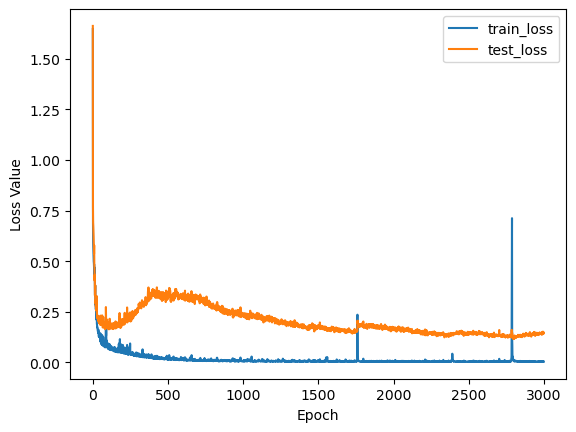

In [81]:
plt.plot(train_loss_list, label='train_loss')
plt.plot(test_loss_list, label = 'test_loss')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
# plt.ylim([0.5, 1])
plt.legend(loc='upper right')
plt.savefig("lossvalue",dpi=1200)
plt.show()


In [82]:
predict_list = []
label_list = []
#Change the "test_dl" to "train_dl" to see the result of the training set
for (X,x_csv, y) in test_dl:
    X, x_csv,y = X.to(device), x_csv.to(device), y.to(device)

    predict_score = big_model(X,x_csv)

    # predict_score = best_model(x)
    predict_list.append(predict_score.flatten().detach().cpu().numpy().flatten())
    label_list.append(y.flatten().detach().cpu().numpy())

predict_array = np.hstack(predict_list)
label_array = np.hstack(label_list)
#predict_array[:5],label_array[:5]

data_to_write2 = np.column_stack((predict_array, label_array))

torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([31, 2, 100])
torch.Size([31, 200])
torch.Size([28, 2, 100])
torch.Size([28, 200])


In [83]:
r2_score(label_array, predict_array)

0.8323914677126585

In [84]:
mean_absolute_error(label_array, predict_array)

0.16719715

In [85]:
mean_squared_error(label_array, predict_array)

0.11219973

In [86]:
import csv

In [87]:
data_to_write2 = np.column_stack((predict_array, label_array, csv_files_test))#Change this line to decide which information you want to write in the CSV file
csv_filename = "predictions_and_labels_train.csv"
with open(csv_filename, 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)
   
    # Write title line
    writer.writerow(['Prediction', 'Label','csvfile'])
    
    # Write data to CSV file
    for row in data_to_write2:
        writer.writerow(row)

ValueError: all the input array dimensions except for the concatenation axis must match exactly, but along dimension 0, the array at index 0 has size 183 and the array at index 2 has size 731